In [21]:
import igraph
import matplotlib.pyplot as plt

In [4]:
graph = igraph.Graph()
graph = graph.Read_GraphML('../models/full_comment_graph.graphml')

In [33]:
def plot(chart):
    return igraph.plot(chart)

In [5]:
graph.vcount()

10000

In [6]:
graph.ecount()

36914

In [16]:
simple_graph = graph.simplify(multiple=True, loops=False)

In [17]:
simple_graph.vcount()

10000

In [18]:
simple_graph.ecount()

29793

In [50]:
components = simple_graph.biconnected_components()
plot(components)

In [113]:
largest_comp = max(components.subgraphs(), key=lambda x: x.vcount())

In [114]:
largest_comp.ecount()

29178

In [219]:
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
import pandas as pd
data = list(largest_comp.degree_distribution().bins())
df = pd.DataFrame(data)
df.head()

,0,1,2
0,2.0,3.0,593
1,3.0,4.0,857
2,4.0,5.0,1329
3,5.0,6.0,1460
4,6.0,7.0,1327


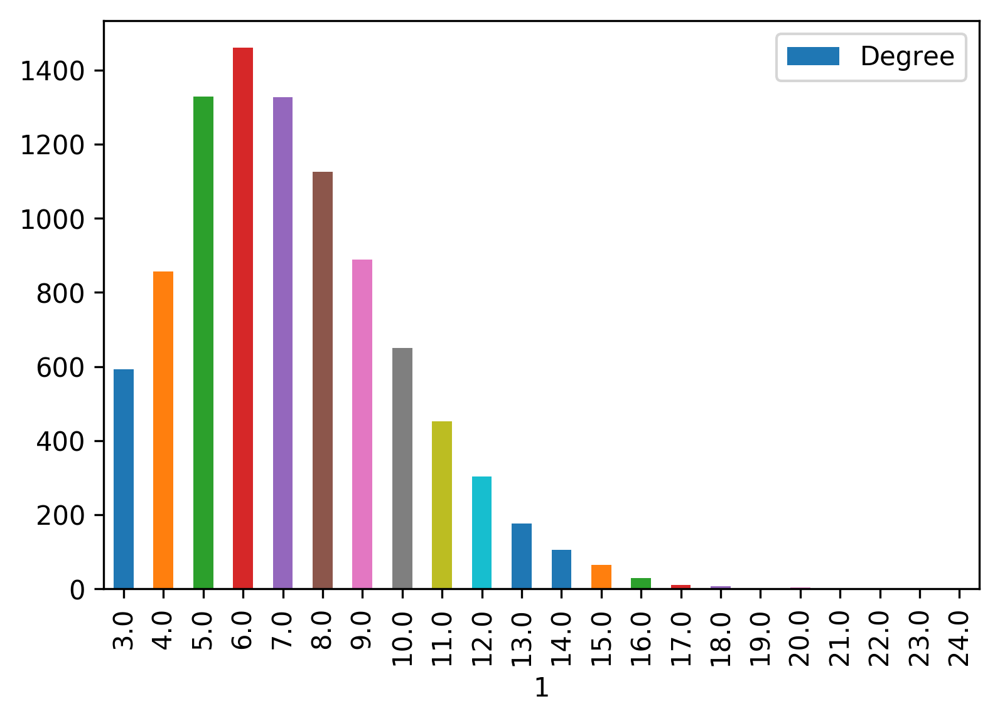

In [188]:
df.plot.bar(x=1, y=2, label='Degree')

In [189]:
%%time
fast_greedy = largest_comp.community_fastgreedy()

CPU times: user 404 ms, sys: 5.08 ms, total: 409 ms
Wall time: 408 ms


In [190]:
fast_greedy.as_clustering().modularity

0.4532887948628531

In [191]:
%%time
multi_level = largest_comp.community_multilevel()

CPU times: user 776 ms, sys: 6.35 ms, total: 782 ms
Wall time: 780 ms


In [192]:
multi_level.modularity

0.4555848892411927

In [193]:
%%time
infomap = largest_comp.community_infomap()

CPU times: user 1min 1s, sys: 1.26 s, total: 1min 3s
Wall time: 1min 3s


In [194]:
infomap.modularity

0.41072829144346257

In [201]:
%%time
lead_eigen = largest_comp.community_leading_eigenvector()

CPU times: user 2.72 s, sys: 275 ms, total: 3 s
Wall time: 2.95 s


In [202]:
lead_eigen.modularity

0.3754050850971942

In [204]:
%%time
walktrap = largest_comp.community_walktrap()

CPU times: user 4.38 s, sys: 78.6 ms, total: 4.46 s
Wall time: 4.44 s


In [209]:
walktrap.as_clustering().modularity

0.34971466931558104

In [210]:
## without preprocessing

In [211]:
%%time
fast_greedy = simple_graph.community_fastgreedy()

CPU times: user 705 ms, sys: 295 ms, total: 1 s
Wall time: 1.03 s


In [212]:
fast_greedy.as_clustering().modularity

0.4609372296588979

In [213]:
%%time
multi_level = simple_graph.community_multilevel()

CPU times: user 1.14 s, sys: 12 ms, total: 1.15 s
Wall time: 1.15 s


In [214]:
multi_level.modularity

0.4653937220807168

In [215]:
%%time
lead_eigen = simple_graph.community_leading_eigenvector()

CPU times: user 3.6 s, sys: 380 ms, total: 3.98 s
Wall time: 3.89 s


In [216]:
lead_eigen.modularity

0.4134501544360314

In [217]:
%%time
walktrap = largest_comp.community_walktrap()

CPU times: user 4.52 s, sys: 77 ms, total: 4.6 s
Wall time: 4.58 s


In [218]:
walktrap.as_clustering().modularity

0.34971466931558104

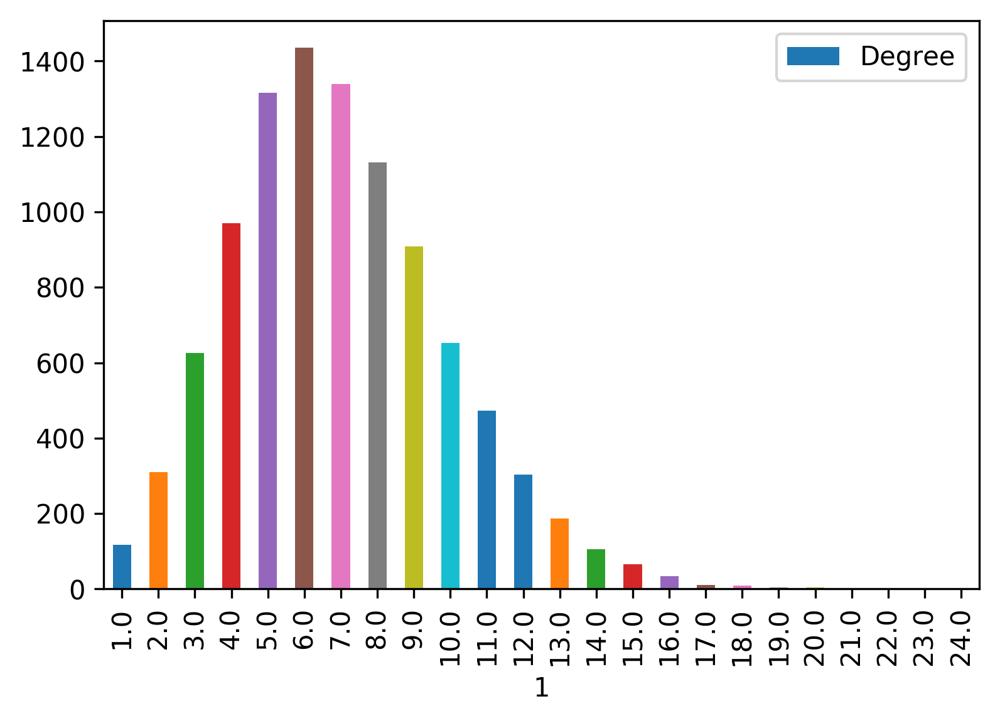

In [220]:
data = list(simple_graph.degree_distribution().bins())
df = pd.DataFrame(data)
df.plot.bar(x=1, y=2, label='Degree')